In [1]:
!pip install sktime

DEPRECATION: tsinfer 0.3.0 has a non-standard dependency specifier zarr>=2.2!=2.11.0!=2.11.1!=2.11.2. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of tsinfer or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [2]:
import numpy as np
# from numpy.random import randint, seed
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib import colors

from sklearn.linear_model import RidgeClassifierCV
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator, TransformerMixin

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.feature_selection import mutual_info_regression, r_regression
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from scipy.special import softmax


from collections import defaultdict
from scipy.stats import spearmanr
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform
from sktime.datasets import load_UCR_UEA_dataset


import numpy as np
import random
import tensorflow as tf

from sklearn import tree


from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest



seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
random.seed(seed)

C:\Users\Tanuj\AppData\Local\Temp\ipykernel_18276\2244662512.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [3]:

def preprocess(dataset):
    # 1 Load data

    X_train, y_train = load_UCR_UEA_dataset(name=dataset, split="train", return_type="numpy2d")
    X_test, y_test = load_UCR_UEA_dataset(name=dataset, split="test", return_type="numpy2d")

    return X_train, X_test, y_train, y_test

In [4]:
## GunPoint

x_train_gunpoint, x_test_gunpoint, y_train_gunpoint, y_test_gunpoint = preprocess("GunPoint")

In [5]:
# Angus Dempster, Francois Petitjean, Geoff Webb
#
# @article{dempster_etal_2020,
#   author  = {Dempster, Angus and Petitjean, Fran\c{c}ois and Webb, Geoffrey I},
#   title   = {ROCKET: Exceptionally fast and accurate time classification using random convolutional kernels},
#   year    = {2020},
#   journal = {Data Mining and Knowledge Discovery},
#   doi     = {https://doi.org/10.1007/s10618-020-00701-z}
# }
#
# https://arxiv.org/abs/1910.13051 (preprint)


import numpy as np
from numba import njit, prange


@njit("Tuple((float64[:],int32[:],float64[:],int32[:],int32[:]))(int64,int64)")
def generate_kernels(input_length, num_kernels):
    candidate_lengths = np.array((7, 9, 11), dtype=np.int32)
    lengths = np.random.choice(candidate_lengths, num_kernels)

    weights = np.zeros(lengths.sum(), dtype=np.float64)
    biases = np.zeros(num_kernels, dtype=np.float64)
    dilations = np.zeros(num_kernels, dtype=np.int32)
    paddings = np.zeros(num_kernels, dtype=np.int32)

    a1 = 0

    for i in range(num_kernels):
        _length = lengths[i]

        _weights = np.random.normal(0, 1, _length)

        b1 = a1 + _length
        weights[a1:b1] = _weights - _weights.mean()

        biases[i] = np.random.uniform(-1, 1)

        dilation = 2 ** np.random.uniform(0, np.log2((input_length - 1) / (_length - 1)))
        dilation = np.int32(dilation)
        dilations[i] = dilation

        padding = ((_length - 1) * dilation) // 2 if np.random.randint(2) == 1 else 0
        paddings[i] = padding

        a1 = b1

    return weights, lengths, biases, dilations, paddings


@njit(fastmath=True)
def apply_kernel(X, weights, length, bias, dilation, padding):
    input_length = len(X)

    output_length = (input_length + (2 * padding)) - ((length - 1) * dilation)

    if output_length < 0:
        print(output_length)

    _ppv = 0
    _max = np.NINF

    end = (input_length + padding) - ((length - 1) * dilation)

    for i in range(-padding, end):

        _sum = bias

        index = i

        for j in range(length):

            if index > -1 and index < input_length:
                _sum = _sum + weights[j] * X[index]

            index = index + dilation

        if _sum > _max:
            _max = _sum

        if _sum > 0:
            _ppv += 1


    return _ppv / output_length, _max


@njit("float64[:,:](float64[:,:],Tuple((float64[::1],int32[:],float64[:],int32[:],int32[:])))", parallel=True,
      fastmath=True)
def apply_kernels(X, kernels):
    weights, lengths, biases, dilations, paddings = kernels

    num_examples, _ = X.shape
    num_kernels = len(lengths)

    _X = np.zeros((num_examples, num_kernels * 2), dtype=np.float64)  # 2 features per kernel

    for i in prange(num_examples):

        a1 = 0  # for weights
        a2 = 0  # for features

        for j in range(num_kernels):
            b1 = a1 + lengths[j]
            b2 = a2 + 2

            _X[i, a2:b2] = apply_kernel(X[i], weights[a1:b1], lengths[j], biases[j], dilations[j], paddings[j])

            a1 = b1
            a2 = b2

    return _X

In [6]:
from sklearn.preprocessing import LabelEncoder


def generate_kernels_1(input_length, num_kernels):
    kernels = generate_kernels(input_length, num_kernels)
    print_kernel_info(kernels)
    return kernels

def print_kernel_info(kernels):
    weights, lengths, biases, dilations, paddings = kernels
    # This print part was just to check if the dimensions and dtypes fit the apply
    print("Type of weights:", type(weights), ", Shape:", weights.shape, ", Dimensions:", weights.ndim, ", Dtype:", weights.dtype)
    print("Type of lengths:", type(lengths), ", Shape:", lengths.shape, ", Dimensions:", lengths.ndim, ", Dtype:", lengths.dtype)
    print("Type of biases:", type(biases), ", Shape:", biases.shape, ", Dimensions:", biases.ndim, ", Dtype:", biases.dtype)
    print("Type of dilations:", type(dilations), ", Shape:", dilations.shape, ", Dimensions:", dilations.ndim, ", Dtype:", dilations.dtype)
    print("Type of paddings:", type(paddings), ", Shape:", paddings.shape, ", Dimensions:", paddings.ndim, ", Dtype:", paddings.dtype)

def apply_transformations(X, kernels):
    return apply_kernels(X, kernels)

def encode_labels(y_train, y_test):
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_test_encoded = le.fit_transform(y_test)
    return y_train_encoded, y_test_encoded

def train_classifier(x_train, y_train):
  # Kontrollera dimensionerna på X
    if x_train.ndim == 1:
      x_train = x_train.reshape(-1, 1)
    classifier = RidgeClassifierCV(alphas=np.logspace(-3, 3, 10), fit_intercept=True)
    classifier.fit(x_train, y_train)
    return classifier

def evaluate_classifier(classifier, x_test, y_test):
    accuracy = classifier.score(x_test, y_test)
    print("Model accuracy:", accuracy)
    return accuracy





In [7]:
#for dataset "GunPoint"

kernels_gunpoint = generate_kernels_1(x_train_gunpoint.shape[-1], num_kernels=300)
x_train_transformed_gunpoint = apply_transformations(x_train_gunpoint, kernels_gunpoint)
x_test_transformed_gunpoint = apply_transformations(x_test_gunpoint, kernels_gunpoint)
y_train_encoded_gunpoint, y_test_encoded_gunpoint = encode_labels(y_train_gunpoint, y_test_gunpoint)
classifier_gunpoint = train_classifier(x_train_transformed_gunpoint, y_train_encoded_gunpoint)
accuracy_gunpoint = evaluate_classifier(classifier_gunpoint, x_test_transformed_gunpoint, y_test_encoded_gunpoint)




Type of weights: <class 'numpy.ndarray'> , Shape: (2718,) , Dimensions: 1 , Dtype: float64
Type of lengths: <class 'numpy.ndarray'> , Shape: (300,) , Dimensions: 1 , Dtype: int32
Type of biases: <class 'numpy.ndarray'> , Shape: (300,) , Dimensions: 1 , Dtype: float64
Type of dilations: <class 'numpy.ndarray'> , Shape: (300,) , Dimensions: 1 , Dtype: int32
Type of paddings: <class 'numpy.ndarray'> , Shape: (300,) , Dimensions: 1 , Dtype: int32
Model accuracy: 0.9866666666666667


In [8]:


def calculate_feature_impacts(coefs, x_test_transform ):
    """Calculate the impacts of features on the instance at the given index."""
    feature_impacts = coefs * x_test_transform
    #coefs_reshaped = coefs.reshape(-1, 1)
    #feature_impacts = coefs_reshaped * x_test_transform
    return feature_impacts



def select_and_segment_features(feature_impacts, n_top_coef, kernel_size, ts_idx):
    # Sortera index för de största positiva påverkan

    # Identifiera features som stöder klass 1 (positiv påverkan)
    top_positive_indices = np.argsort(feature_impacts[ts_idx, :])[::-1][:n_top_coef]
    significant_positive_features = top_positive_indices  # renamed from inds_agg_pos

    # Bestäm segmentering för features med positiv påverkan
    positive_features_below_kernel_size = significant_positive_features < kernel_size
    positive_features_above_kernel_size = significant_positive_features >= kernel_size

    # Beräkna index inom varje featuregrupp för positiv påverkan
    halved_indices_below_kernel_size_pos = significant_positive_features[positive_features_below_kernel_size] / 2
    halved_indices_above_kernel_size_pos = significant_positive_features[positive_features_above_kernel_size] / 2
    indices_below_kernel_size_pos = halved_indices_below_kernel_size_pos.astype(int)
    indices_above_kernel_size_pos = halved_indices_above_kernel_size_pos.astype(int)

    # Identifiera features som stöder klass 0 (negativ påverkan)
    top_negative_indices = np.argsort(feature_impacts[ts_idx, :])[:n_top_coef]
    # top_negative_coefs = coefs[top_negative_indices]
    significant_negative_features = top_negative_indices  # renamed from inds_agg_neg

    # Bestäm segmentering för features med negativ påverkan
    negative_features_below_kernel_size = significant_negative_features < kernel_size
    negative_features_above_kernel_size = significant_negative_features >= kernel_size

    # Beräkna index inom varje featuregrupp för negativ påverkan
    halved_indices_below_kernel_size_neg = significant_negative_features[negative_features_below_kernel_size] / 2
    halved_indices_above_kernel_size_neg = significant_negative_features[negative_features_above_kernel_size] / 2
    indices_below_kernel_size_neg = halved_indices_below_kernel_size_neg.astype(int)
    indices_above_kernel_size_neg = halved_indices_above_kernel_size_neg.astype(int)

    return positive_features_below_kernel_size, positive_features_above_kernel_size, indices_below_kernel_size_pos, indices_above_kernel_size_pos, negative_features_below_kernel_size, negative_features_above_kernel_size, indices_below_kernel_size_neg, indices_above_kernel_size_neg




def calculate_contributions(coefs, indices, feature_indices, ts_idx, x_test_transform):

    # Ensure feature_indices are within the bounds of coefs and x_test_transform
    valid_indices = feature_indices[feature_indices < len(coefs)]
    valid_indices = valid_indices[valid_indices < x_test_transform.shape[1]]

    # Calculate contributions
    contributions = np.abs(coefs[valid_indices])  # Use only valid indices for coefs
    contribution_values = contributions * x_test_transform[ts_idx, valid_indices]  # Corresponding feature values

    return contribution_values




In [9]:

# Assuming the classifier and transformed dataset are already available

coefs = classifier_gunpoint.coef_.reshape(classifier_gunpoint.coef_.shape[1])
percentage_chosen_coefficients = 0.2
n_top_coef = int(len(coefs) * percentage_chosen_coefficients)
kernel_size = 100  # Define or assume as a global parameter

# Example usage with a specific test index
ts_idx = 51  # Example test index for local explainability



feature_impacts = calculate_feature_impacts(coefs, x_test_transformed_gunpoint)
pred_selected_instance = classifier_gunpoint.predict(x_test_transformed_gunpoint[ts_idx, :].reshape(1, -1))
print("predicted class:", pred_selected_instance)

# Selecting and segmenting features based on their impacts


# Välja och segmentera features baserat på deras påverkan (du behöver implementera denna funktion)
(positive_features_below_kernel_size, positive_features_above_kernel_size,
 indices_below_kernel_size_pos, indices_above_kernel_size_pos,
 negative_features_below_kernel_size, negative_features_above_kernel_size,
 indices_below_kernel_size_neg, indices_above_kernel_size_neg) = select_and_segment_features(feature_impacts, n_top_coef, kernel_size, ts_idx)

# Debugging eller vidare analys
print("#Gunpoint kernels from features below kernel size for positive class:", np.sum(positive_features_below_kernel_size))
print("#Gunpoint kernels from features above kernel size for positive class:", np.sum(positive_features_above_kernel_size))
print("#Gunpoint kernels from features below kernel size for negative class:", np.sum(negative_features_below_kernel_size))
print("#Gunpoint kernels from features above kernel size for negative class:", np.sum(negative_features_above_kernel_size))

# Beräkna bidrag för varje grupp (du behöver implementera denna funktion)
contributions_below_kernel_size_pos = calculate_contributions(coefs, indices_below_kernel_size_pos, indices_below_kernel_size_pos, ts_idx, x_test_transformed_gunpoint)
contributions_above_kernel_size_pos = calculate_contributions(coefs, indices_above_kernel_size_pos, indices_above_kernel_size_pos, ts_idx, x_test_transformed_gunpoint)
contributions_below_kernel_size_neg = calculate_contributions(coefs, indices_below_kernel_size_neg, indices_below_kernel_size_neg, ts_idx, x_test_transformed_gunpoint)
contributions_above_kernel_size_neg = calculate_contributions(coefs, indices_above_kernel_size_neg, indices_above_kernel_size_neg, ts_idx, x_test_transformed_gunpoint)




predicted class: [0]
#Gunpoint kernels from features below kernel size for positive class: 23
#Gunpoint kernels from features above kernel size for positive class: 97
#Gunpoint kernels from features below kernel size for negative class: 19
#Gunpoint kernels from features above kernel size for negative class: 101


In [10]:
def dilate_kernel(weights, dilation):

    length = len(weights)
    receptive_field = int((length - 1) * dilation + 1)
    kernel_dilated = np.zeros(receptive_field)
    index = 0

    for j in range(length):
        kernel_dilated[index] = weights[j]
        index = index + dilation

    return kernel_dilated


def feature_map_kernel_pad(X, weights, length, bias, dilation, padding):

    input_length = len(X)
    receptive_field = int((length - 1) * dilation + 1)

    rf_padding = np.zeros(int((receptive_field - 1)/2))
    X_padded = np.concatenate((rf_padding, X, rf_padding), axis=None)

    indices_contributors = []
    values_contributors = []

    fm_single_kernel = np.zeros(input_length)
    kernel_dilated = dilate_kernel(weights,dilation)

    for t in range(input_length):
        fm_single_kernel[t] = bias + np.inner(kernel_dilated, X_padded[t:t+receptive_field])

        indices_contributors.append(t + np.nonzero(kernel_dilated)[0] - int((receptive_field - 1)/2))
        values_contributors.append(fm_single_kernel[t])

    return fm_single_kernel, indices_contributors, values_contributors

def feature_map_kernel_nopad(X, weights, length, bias, dilation, padding):

    input_length = len(X)
    receptive_field = int((length - 1) * dilation + 1)

    indices_contributors = []
    values_contributors = []

    fm_single_kernel = np.zeros(input_length)
    kernel_dilated = dilate_kernel(weights,dilation)

    for t in range(input_length - receptive_field + 1):
        fm_single_kernel[t] = bias + np.inner(kernel_dilated, X[t:t+receptive_field])

        indices_contributors.append(t + np.nonzero(kernel_dilated)[0])
        values_contributors.append(fm_single_kernel[t])

    return fm_single_kernel, indices_contributors, values_contributors


def calc_features_contribution(indices_contributors, values_contributors, length_ts):

    contributions = np.empty([length_ts,length_ts])
    contributions[:] = np.nan
    contributions_dividor = np.ones([length_ts,length_ts])

    ppv_absolute = np.sum(np.array(values_contributors) > 0)

    for i in range(len(values_contributors)):

        indices = indices_contributors[i]

        for j in indices:
            if j >= 0 and j < length_ts:
                contributions[i,j] = values_contributors[i]
                contributions_dividor[i,j] = len(indices)

    contributions_ppv = contributions.copy()
    positive_entries = contributions_ppv > 0
    contributions_ppv[positive_entries] = 1
    contributions_ppv[~positive_entries] = 0
    contributions_ppv_feat = np.any(contributions_ppv >0, axis=0)
    if ~np.all(contributions_ppv_feat == 0):
        contributions_ppv_feat = contributions_ppv_feat / np.nansum(contributions_ppv_feat)

    contributions_mv_feat = np.nanmax(contributions, axis = 0)
    max_val_ind = contributions_mv_feat == np.max(contributions_mv_feat)
    contributions_mv_feat[max_val_ind] = 1
    contributions_mv_feat[~max_val_ind] = 0
    if ~np.all(contributions_mv_feat == 0):
        contributions_mv_feat = contributions_mv_feat / np.nansum(contributions_mv_feat)

    return contributions_ppv_feat, contributions_mv_feat


def feature_map_xAI(X, kernels, inds):
    weights, lengths, biases, dilations, paddings = kernels
    fm_array = []
    features_contribution_ppv = []
    features_contribution_mv = []

    for j in inds:
        a1 = sum(lengths[:j])
        b1 = sum(lengths[:j + 1])
        wlts = weights[a1:b1]

        if paddings[j] == 0:
            fm_single_kernel, indices_contributors, values_contributors = feature_map_kernel_nopad(X, wlts, lengths[j], biases[j], dilations[j], paddings[j])
        else:
            fm_single_kernel, indices_contributors, values_contributors = feature_map_kernel_pad(X, wlts, lengths[j], biases[j], dilations[j], paddings[j])

        fm_array.append(fm_single_kernel)

        contributions_ppv, contributions_mv = calc_features_contribution(indices_contributors, values_contributors, len(X))

        features_contribution_ppv.append(contributions_ppv)
        features_contribution_mv.append(contributions_mv)

    fm_array_arr = np.array(fm_array)
    features_contribution_arr_ppv = np.vstack(np.array(features_contribution_ppv))
    features_contribution_arr_mv = np.vstack(np.array(features_contribution_mv))

    return fm_array_arr, features_contribution_arr_ppv, features_contribution_arr_mv




In [11]:
import numpy as np
from sklearn.feature_selection import mutual_info_regression

# Function to dilate the kernel
def dilate_kernel_2(kernel_weights, dilation):
    dilated_kernel = np.zeros((len(kernel_weights) - 1) * dilation + 1)
    dilated_kernel[::dilation] = kernel_weights
    return dilated_kernel



def select_kernels_with_mutual_info(features_contribution_ppv, features_contribution_mv, num_kernels, y, threshold=0.1):
    """
    Identify the important kernels based on the contribution scores and mutual information.
    """
    num_important_kernels = int(num_kernels * threshold)

    # Compute mutual information for each kernel
    mi_ppv = []
    mi_mv = []

    for i in range(features_contribution_ppv.shape[0]):
        mi_ppv.append(mutual_info_regression(features_contribution_ppv[i].reshape(-1, 1), y))

    for i in range(features_contribution_mv.shape[0]):
        mi_mv.append(mutual_info_regression(features_contribution_mv[i].reshape(-1, 1), y))

    mi_ppv = np.array(mi_ppv).flatten()
    mi_mv = np.array(mi_mv).flatten()

    # Combine contribution scores and mutual information for final importance score
    importance_score_ppv = np.sum(features_contribution_ppv, axis=1) * mi_ppv
    importance_score_mv = np.sum(features_contribution_mv, axis=1) * mi_mv

    important_kernel_indices_ppv = np.argsort(importance_score_ppv)[::-1][:num_important_kernels]
    important_kernel_indices_mv = np.argsort(importance_score_mv)[::-1][:num_important_kernels]

    return important_kernel_indices_ppv, important_kernel_indices_mv

def get_kernel_parameters(important_kernel_indices, kernels):
    """
    Get the parameters of the important kernels.
    """
    weights, lengths, biases, dilations, paddings = kernels
    #print("Shapes of the kernel parameter arrays:")
    #print(f"weights.shape: {weights.shape}")
    #print(f"lengths.shape: {lengths.shape}")
    #print(f"biases.shape: {biases.shape}")
    #print(f"dilations.shape: {dilations.shape}")
    #print(f"paddings.shape: {paddings.shape}")

    kernel_parameters = []
    start_idx = 0
    for idx in important_kernel_indices:
        kernel_length = lengths[idx]
        end_idx = start_idx + kernel_length
        kernel_weights = weights[start_idx:end_idx]
        kernel_bias = biases[idx]
        kernel_dilation = dilations[idx]
        kernel_padding = paddings[idx]

        #print(f"Kernel {idx}:")
        #print(f"kernel_length: {kernel_length}")
        #print(f"kernel_weights.shape: {kernel_weights.shape}")
        #print(f"kernel_bias: {kernel_bias}")
        #print(f"kernel_dilation: {kernel_dilation}")
        #print(f"kernel_padding: {kernel_padding}")

        kernel_parameters.append((kernel_length, kernel_weights, kernel_bias, kernel_dilation, kernel_padding))
        start_idx = end_idx
    return kernel_parameters


def map_kernels_to_input(kernel_parameters, input_ts):
    """
    Map the important kernels back to the input time steps.
    """
    input_length = len(input_ts)
    mapped_kernels = []
    for kernel_length, kernel_weights, kernel_bias, kernel_dilation, kernel_padding in kernel_parameters:
        receptive_field = int((kernel_length - 1) * kernel_dilation + 1)
        kernel_dilated = dilate_kernel(kernel_weights, kernel_dilation)
        print(f"kernel_weights: {kernel_weights}, dilation: {kernel_dilation}, kernel_dilated: {kernel_dilated}")
        input_mappings = []
        for t in range(input_length - receptive_field + 1):
            input_slice = input_ts[t:t+receptive_field]
            print(f"t: {t}, input_slice: {input_slice}, kernel_dilated: {kernel_dilated}")
            kernel_value = kernel_bias + np.inner(kernel_dilated, input_slice)
            print(f"t: {t}, kernel_value: {kernel_value}")
            input_mappings.append((t, kernel_value))
        mapped_kernels.append(input_mappings)
    return mapped_kernels


In [12]:
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import RidgeClassifierCV

# Function definitions are assumed to be pre-defined as discussed earlier

# For positively influencing features from the first group
fm_ROCKET, features_contribution_1_pos_ppv_p, features_contribution_1_pos_mv = feature_map_xAI(x_test_gunpoint[ts_idx], kernels_gunpoint, indices_below_kernel_size_pos)


# For positively influencing features from the second group
fm_ROCKET, features_contribution_2_pos_ppv_p, features_contribution_2_pos_mv = feature_map_xAI(x_test_gunpoint[ts_idx], kernels_gunpoint, indices_above_kernel_size_pos)


# For negatively influencing features from the first group
fm_ROCKET, features_contribution_1_neg_ppv_p, features_contribution_1_neg_mv = feature_map_xAI(x_test_gunpoint[ts_idx], kernels_gunpoint, indices_below_kernel_size_neg)


# For negatively influencing features from the second group
fm_ROCKET, features_contribution_2_neg_ppv_p, features_contribution_2_neg_mv = feature_map_xAI(x_test_gunpoint[ts_idx], kernels_gunpoint, indices_above_kernel_size_neg)



C:\Users\Tanuj\AppData\Local\Temp\ipykernel_18276\4012423984.py:82: RuntimeWarning: All-NaN slice encountered
  contributions_mv_feat = np.nanmax(contributions, axis = 0)


In [13]:
# Identify the important kernels#y_train_encoded_gunpoint, y_test_encoded_gunpoint
#features_contribution_1_pos_ppv_p, features_contribution_1_pos_mv
#features_contribution_2_pos_ppv_p, features_contribution_2_pos_mv indices_above_kernel_size_pos

#features_contribution_1_neg_ppv_p, features_contribution_1_neg_mv
important_kernel_indices_ppv, important_kernel_indices_mv = select_kernels_with_mutual_info(features_contribution_1_pos_ppv_p, features_contribution_1_pos_mv , len(indices_below_kernel_size_pos), y_test_encoded_gunpoint, threshold=0.2)
# Get the input time series


input_ts = x_test_transformed_gunpoint[0].reshape(1, -1)
input_ts_k = x_test_gunpoint[ts_idx]


# Get the kernels
kernels = kernels_gunpoint
# Get the parameters of the important kearnels
kernel_parameters_ppv_k = get_kernel_parameters(important_kernel_indices_ppv, kernels)



mapped_kernels_ppv = map_kernels_to_input(kernel_parameters_ppv_k, input_ts_k)

kernel_weights: [-0.3416554   0.43321955 -1.15212233  0.0404729   1.32937194 -0.93667635
  0.46323064  1.18395375 -1.0197947   0.0206844  -0.1516644 ], dilation: 4, kernel_dilated: [-0.3416554   0.          0.          0.          0.43321955  0.
  0.          0.         -1.15212233  0.          0.          0.
  0.0404729   0.          0.          0.          1.32937194  0.
  0.          0.         -0.93667635  0.          0.          0.
  0.46323064  0.          0.          0.          1.18395375  0.
  0.          0.         -1.0197947   0.          0.          0.
  0.0206844   0.          0.          0.         -0.1516644 ]
t: 0, input_slice: [-0.68231496 -0.84122606 -0.96696429 -1.0861426  -1.1716968  -1.2395344
 -1.2666384  -1.2766595  -1.2773023  -1.2717757  -1.254899   -1.2383231
 -1.223664   -1.2142693  -1.2058471  -1.2022213  -1.2017147  -1.2025535
 -1.2032954  -1.2025663  -1.2034441  -1.2027816  -1.2042145  -1.2048618
 -1.2036304  -1.204037   -1.2041977  -1.2039108  -1.1939495 

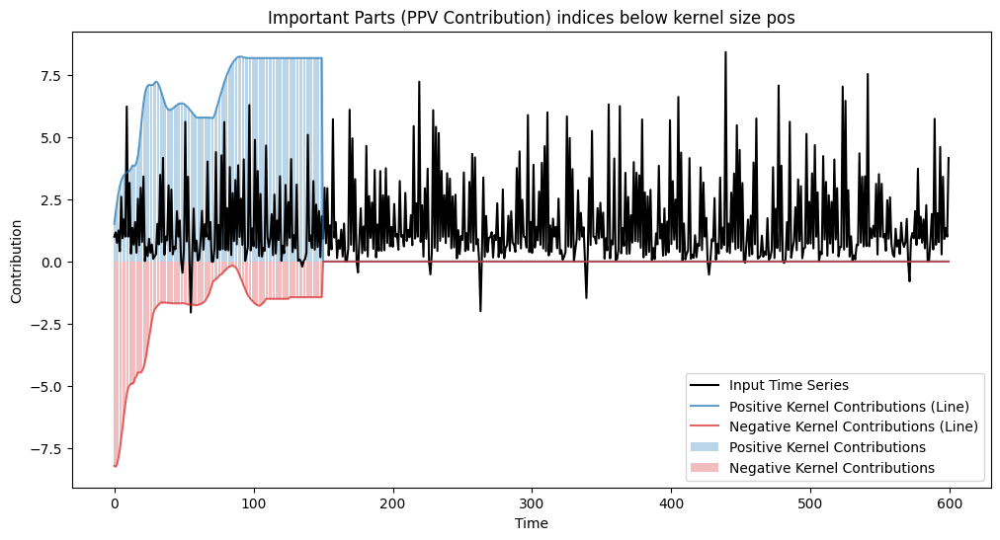

In [14]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_important_parts_bar_kl(input_ts, mapped_kernels, title, kernel_parameters):
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(input_ts.flatten(), color='black', label='Input Time Series')

    bar_data_pos = []
    bar_data_neg = []
    for kernel_mappings, (kernel_length, _, _, kernel_dilation, _) in zip(mapped_kernels, kernel_parameters):
        receptive_field = int((kernel_length - 1) * kernel_dilation + 1)
        kernel_values_pos = [0] * len(input_ts.flatten())
        kernel_values_neg = [0] * len(input_ts.flatten())
        for t, kernel_value in kernel_mappings:
            if kernel_value > 0:
                kernel_values_pos[t:t + receptive_field] = [kernel_value] * receptive_field
            else:
                kernel_values_neg[t:t + receptive_field] = [kernel_value] * receptive_field
        bar_data_pos.append(kernel_values_pos)
        bar_data_neg.append(kernel_values_neg)

    bar_data_pos = np.array(bar_data_pos)
    bar_data_neg = np.array(bar_data_neg)
    x = np.arange(len(input_ts.flatten()))

    total_contributions_pos = bar_data_pos.sum(axis=0)
    total_contributions_neg = bar_data_neg.sum(axis=0)

    ax.bar(x, total_contributions_pos, color='tab:blue', alpha=0.3, label='Positive Kernel Contributions')
    ax.bar(x, total_contributions_neg, color='tab:red', alpha=0.3, label='Negative Kernel Contributions')
    ax.plot(x, total_contributions_pos, color='tab:blue', alpha=0.7, label='Positive Kernel Contributions (Line)')
    ax.plot(x, total_contributions_neg, color='tab:red', alpha=0.7, label='Negative Kernel Contributions (Line)')

    ax.set_title(title)
    ax.set_xlabel('Time')
    ax.set_ylabel('Contribution')
    ax.legend()
    plt.show()

# Exempel på användning med riktiga data och kernel mappings
visualize_important_parts_bar_kl(input_ts, mapped_kernels_ppv, 'Important Parts (PPV Contribution) indices below kernel size pos', kernel_parameters_ppv_k)


In [15]:
import numpy as np
from sklearn.linear_model import RidgeClassifierCV
from sklearn.model_selection import train_test_split
from scipy.stats import bootstrap

# Function to set a segment in the time series to its mean value
def set_segment_to_mean(x, start, end):
    x_modified = x.copy()
    segment_mean = np.mean(x[start:end])
    x_modified[start:end] = segment_mean
    return x_modified

# Function to calculate faithfulness with margin of error
def calculate_faithfulness(model, X_test, important_segments):
    original_confidences = model.decision_function(X_test)
    modified_confidences = []

    for i, x in enumerate(X_test):
        if i >= len(important_segments):
            break  # Ensure we do not go out of bounds
        start, end = important_segments[i]
        if start >= end or start < 0 or end > len(x):
            continue

        x_modified = set_segment_to_mean(x, start, end)

        confidence_original = model.decision_function([x])[0]
        confidence_modified = model.decision_function([x_modified])[0]

        confidence_drop = confidence_original - confidence_modified
        modified_confidences.append(confidence_drop)

        # Debug prints
        print(f"Instance {i}: Start={start}, End={end}")
        print(f"Original confidence: {confidence_original}")
        print(f"Modified confidence: {confidence_modified}")
        print(f"Confidence drop: {confidence_drop}")

    faithfulness_mean = np.mean(modified_confidences)

    if len(modified_confidences) > 1:  # Ensure there is enough data for bootstrap
        res = bootstrap((np.array(modified_confidences),), np.mean, confidence_level=0.95, n_resamples=1000)
        margin_of_error = (res.confidence_interval.high - res.confidence_interval.low) / 2
    else:
        margin_of_error = np.nan

    return faithfulness_mean, margin_of_error

# Identify important segments for each instance in X_test
important_segments = []
receptive_field = 10  # Further increased receptive field
for kernel_mapping in mapped_kernels_ppv:
    for start, _ in kernel_mapping:
        important_segments.append((start, start + receptive_field))

# Ensure important_segments is the same length as X_test
if len(important_segments) < len(x_test_transformed_gunpoint):
    # Repeat important_segments to match the length of X_test
    important_segments = important_segments * (len(x_test_transformed_gunpoint) // len(important_segments)) + important_segments[:len(x_test_transformed_gunpoint) % len(important_segments)]

# Calculate Faithfulness
faithfulness, faithfulness_error = calculate_faithfulness(classifier_gunpoint, x_test_transformed_gunpoint, important_segments)
print(f"Faithfulness: {faithfulness:.4f} ± {faithfulness_error:.4f}")


Instance 0: Start=0, End=10
Original confidence: -1.1068295907495078
Modified confidence: -1.2080814625494938
Confidence drop: 0.10125187179998596
Instance 1: Start=1, End=11
Original confidence: 0.7994382183309572
Modified confidence: 0.7108594445107403
Confidence drop: 0.08857877382021684
Instance 2: Start=2, End=12
Original confidence: 1.0733035649144131
Modified confidence: 0.9635223723976525
Confidence drop: 0.10978119251676066
Instance 3: Start=3, End=13
Original confidence: -1.026615966527043
Modified confidence: -1.1075681204209658
Confidence drop: 0.08095215389392285
Instance 4: Start=4, End=14
Original confidence: -0.72371812449942
Modified confidence: -0.7231472136128896
Confidence drop: -0.0005709108865303847
Instance 5: Start=5, End=15
Original confidence: 0.4278557852626692
Modified confidence: 0.44668356910212115
Confidence drop: -0.01882778383945194
Instance 6: Start=6, End=16
Original confidence: -1.0562376063727155
Modified confidence: -1.1263291530300141
Confidence d

In [16]:
## my code
import numpy as np
from sklearn.linear_model import RidgeClassifierCV
from sklearn.model_selection import train_test_split
from scipy.stats import bootstrap


def reverse_segment(x, start, end):
    x_modified = x.copy()
    x_modified[start:end] = x[start:end][::-1]
    return x_modified
# Function to set a segment in the time series to its mean value
def set_segment_to_mean(x, start, end):
    x_modified = x.copy()
    segment_mean = np.mean(x[start:end])
    x_modified[start:end] = segment_mean
    return x_modified

# Function to calculate faithfulness with margin of error
def calculate_faithfulness(model, X_test, important_segments):
    original_confidences = model.decision_function(X_test)
    modified_confidences = []

    for i, x in enumerate(X_test):
        if i >= len(important_segments):
            break  # Ensure we do not go out of bounds
        start, end = important_segments[i]
        if start >= end or start < 0 or end > len(x):
            continue

        x_modified = reverse_segment(x, start, end)  # Use reversal instead of mean replacement

        confidence_original = model.decision_function([x])[0]
        confidence_modified = model.decision_function([x_modified])[0]

        confidence_drop = confidence_original - confidence_modified
        modified_confidences.append(confidence_drop)

        # Debug prints
        print(f"Instance {i}: Start={start}, End={end}")
        print(f"Original confidence: {confidence_original}")
        print(f"Modified confidence: {confidence_modified}")
        print(f"Confidence drop: {confidence_drop}")

    faithfulness_mean = np.mean(modified_confidences)

    if len(modified_confidences) > 1:  # Ensure there is enough data for bootstrap
        res = bootstrap((np.array(modified_confidences),), np.mean, confidence_level=0.95, n_resamples=1000)
        margin_of_error = (res.confidence_interval.high - res.confidence_interval.low) / 2
    else:
        margin_of_error = np.nan

    return faithfulness_mean, margin_of_error

# Identify important segments for each instance in X_test
important_segments = []
receptive_field = 10  # Further increased receptive field
for kernel_mapping in mapped_kernels_ppv:
    for start, _ in kernel_mapping:
        important_segments.append((start, start + receptive_field))

# Ensure important_segments is the same length as X_test
if len(important_segments) < len(x_test_transformed_gunpoint):
    # Repeat important_segments to match the length of X_test
    important_segments = important_segments * (len(x_test_transformed_gunpoint) // len(important_segments)) + important_segments[:len(x_test_transformed_gunpoint) % len(important_segments)]

# Calculate Faithfulness
faithfulness, faithfulness_error = calculate_faithfulness(classifier_gunpoint, x_test_transformed_gunpoint, important_segments)
print(f"Faithfulness: {faithfulness:.4f} ± {faithfulness_error:.4f}")


Instance 0: Start=0, End=10
Original confidence: -1.1068295907495078
Modified confidence: -1.1923013725820915
Confidence drop: 0.08547178183258364
Instance 1: Start=1, End=11
Original confidence: 0.7994382183309572
Modified confidence: 0.7160232052842597
Confidence drop: 0.08341501304669752
Instance 2: Start=2, End=12
Original confidence: 1.0733035649144131
Modified confidence: 0.996821997426645
Confidence drop: 0.07648156748776813
Instance 3: Start=3, End=13
Original confidence: -1.026615966527043
Modified confidence: -1.0486147806786588
Confidence drop: 0.021998814151615864
Instance 4: Start=4, End=14
Original confidence: -0.72371812449942
Modified confidence: -0.6994087021936841
Confidence drop: -0.02430942230573585
Instance 5: Start=5, End=15
Original confidence: 0.4278557852626692
Modified confidence: 0.4715728512398947
Confidence drop: -0.04371706597722547
Instance 6: Start=6, End=16
Original confidence: -1.0562376063727155
Modified confidence: -1.1339689940630384
Confidence drop

In [17]:
# this is reverse segment code and  identification of important segment according to paper.


import numpy as np
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from scipy.stats import bootstrap
from lime import lime_tabular

# Function to reverse a segment in the time series
def reverse_segment(x, start, end):
    x_modified = x.copy()
    x_modified[start:end] = x[start:end][::-1]
    return x_modified

# Function to calculate faithfulness with margin of error
def calculate_faithfulness(model, X_test, important_segments):
    original_confidences = model.decision_function(X_test)
    modified_confidences = []

    for i, x in enumerate(X_test):
        if i >= len(important_segments):
            break  # Ensure we do not go out of bounds
        start, end = important_segments[i]
        if start >= end or start < 0 or end > len(x):
            continue

        x_modified = reverse_segment(x, start, end)  # Use reversal instead of mean replacement

        confidence_original = model.decision_function([x])[0]
        confidence_modified = model.decision_function([x_modified])[0]

        confidence_drop = confidence_original - confidence_modified
        modified_confidences.append(confidence_drop)

        # Debug prints
        print(f"Instance {i}: Start={start}, End={end}")
        print(f"Original confidence: {confidence_original}")
        print(f"Modified confidence: {confidence_modified}")
        print(f"Confidence drop: {confidence_drop}")

    faithfulness_mean = np.mean(modified_confidences)

    if len(modified_confidences) > 1:  # Ensure there is enough data for bootstrap
        res = bootstrap((np.array(modified_confidences),), np.mean, confidence_level=0.95, n_resamples=1000)
        margin_of_error = (res.confidence_interval.high - res.confidence_interval.low) / 2
    else:
        margin_of_error = np.nan

    return faithfulness_mean, margin_of_error

# Function to identify important segments using LIME
def identify_important_segments(model, X_test, receptive_field=10):
    explainer = lime_tabular.LimeTabularExplainer(
        training_data=X_test,
        mode='classification',
        feature_names=[f'feature_{i}' for i in range(X_test.shape[1])],
        discretize_continuous=False
    )

    important_segments = []
    for i, x in enumerate(X_test):
        exp = explainer.explain_instance(x, model.predict_proba, num_features=receptive_field)
        important_features = exp.as_map()[1]  # Get the explanation for the predicted class
        # Sort features by importance and take the top `receptive_field` features
        important_features = sorted(important_features, key=lambda x: -abs(x[1]))[:receptive_field]
        # Convert features to segment ranges
        for feature_index, _ in important_features:
            start = feature_index
            end = min(start + receptive_field, len(x))
            important_segments.append((start, end))

    return important_segments

# Calculate Faithfulness
faithfulness, faithfulness_error = calculate_faithfulness(classifier_gunpoint, x_test_transformed_gunpoint, important_segments)
print(f"Faithfulness: {faithfulness:.4f} ± {faithfulness_error:.4f}")

Instance 0: Start=0, End=10
Original confidence: -1.1068295907495078
Modified confidence: -1.1923013725820915
Confidence drop: 0.08547178183258364
Instance 1: Start=1, End=11
Original confidence: 0.7994382183309572
Modified confidence: 0.7160232052842597
Confidence drop: 0.08341501304669752
Instance 2: Start=2, End=12
Original confidence: 1.0733035649144131
Modified confidence: 0.996821997426645
Confidence drop: 0.07648156748776813
Instance 3: Start=3, End=13
Original confidence: -1.026615966527043
Modified confidence: -1.0486147806786588
Confidence drop: 0.021998814151615864
Instance 4: Start=4, End=14
Original confidence: -0.72371812449942
Modified confidence: -0.6994087021936841
Confidence drop: -0.02430942230573585
Instance 5: Start=5, End=15
Original confidence: 0.4278557852626692
Modified confidence: 0.4715728512398947
Confidence drop: -0.04371706597722547
Instance 6: Start=6, End=16
Original confidence: -1.0562376063727155
Modified confidence: -1.1339689940630384
Confidence drop

In [18]:
import numpy as np
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from scipy.stats import bootstrap
from lime import lime_tabular

# Function to zero out a segment in the time series
def zero_out_segment(x, start, end):
    x_modified = x.copy()
    x_modified[start:end] = 0
    return x_modified

# Function to add noise to a segment in the time series
def add_noise_segment(x, start, end, noise_level=0.1):
    x_modified = x.copy()
    x_modified[start:end] += np.random.normal(0, noise_level, end - start)
    return x_modified

# Function to calculate faithfulness with margin of error using noise addition
def calculate_faithfulness_with_noise(model, X_test, important_segments):
    original_confidences = model.decision_function(X_test)
    modified_confidences = []

    for i, x in enumerate(X_test):
        if i >= len(important_segments):
            break  # Ensure we do not go out of bounds
        start, end = important_segments[i]
        if start >= end or start < 0 or end > len(x):
            continue

        x_modified = add_noise_segment(x, start, end)  # Use noise addition instead of zeroing out

        confidence_original = model.decision_function([x])[0]
        confidence_modified = model.decision_function([x_modified])[0]

        confidence_drop = confidence_original - confidence_modified
        modified_confidences.append(confidence_drop)

        # Debug prints
        print(f"Instance {i}: Start={start}, End={end}")
        print(f"Original confidence: {confidence_original}")
        print(f"Modified confidence: {confidence_modified}")
        print(f"Confidence drop: {confidence_drop}")

    faithfulness_mean = np.mean(modified_confidences)

    if len(modified_confidences) > 1:  # Ensure there is enough data for bootstrap
        res = bootstrap((np.array(modified_confidences),), np.mean, confidence_level=0.95, n_resamples=1000)
        margin_of_error = (res.confidence_interval.high - res.confidence_interval.low) / 2
    else:
        margin_of_error = np.nan

    return faithfulness_mean, margin_of_error

# Function to identify important segments using LIME with adjusted parameters
def identify_important_segments(model, X_test, receptive_field=10, num_samples=5000):
    explainer = lime_tabular.LimeTabularExplainer(
        training_data=X_test,
        mode='classification',
        feature_names=[f'feature_{i}' for i in range(X_test.shape[1])],
        discretize_continuous=False
    )

    important_segments = []
    for i, x in enumerate(X_test):
        exp = explainer.explain_instance(x, model.predict_proba, num_features=receptive_field, num_samples=num_samples)
        important_features = exp.as_map()[1]  # Get the explanation for the predicted class
        # Sort features by importance and take the top `receptive_field` features
        important_features = sorted(important_features, key=lambda x: -abs(x[1]))[:receptive_field]
        # Convert features to segment ranges
        for feature_index, _ in important_features:
            start = feature_index
            end = min(start + receptive_field, len(x))
            important_segments.append((start, end))

    return important_segments



# Calculate Faithfulness
faithfulness, faithfulness_error = calculate_faithfulness(classifier_gunpoint, x_test_transformed_gunpoint, important_segments)
print(f"Faithfulness: {faithfulness:.4f} ± {faithfulness_error:.4f}")

Instance 0: Start=0, End=10
Original confidence: -1.1068295907495078
Modified confidence: -1.1923013725820915
Confidence drop: 0.08547178183258364
Instance 1: Start=1, End=11
Original confidence: 0.7994382183309572
Modified confidence: 0.7160232052842597
Confidence drop: 0.08341501304669752
Instance 2: Start=2, End=12
Original confidence: 1.0733035649144131
Modified confidence: 0.996821997426645
Confidence drop: 0.07648156748776813
Instance 3: Start=3, End=13
Original confidence: -1.026615966527043
Modified confidence: -1.0486147806786588
Confidence drop: 0.021998814151615864
Instance 4: Start=4, End=14
Original confidence: -0.72371812449942
Modified confidence: -0.6994087021936841
Confidence drop: -0.02430942230573585
Instance 5: Start=5, End=15
Original confidence: 0.4278557852626692
Modified confidence: 0.4715728512398947
Confidence drop: -0.04371706597722547
Instance 6: Start=6, End=16
Original confidence: -1.0562376063727155
Modified confidence: -1.1339689940630384
Confidence drop

In [19]:
import numpy as np
from scipy.stats import bootstrap

def calculate_robustness_p(original_mapped_kernels, perturbed_mapped_kernels):
    robustness_values = []
    for original, perturbed in zip(original_mapped_kernels, perturbed_mapped_kernels):
        original_values = np.array([value for _, value in original])
        perturbed_values = np.array([value for _, value in perturbed])
        robustness = np.mean(np.abs(original_values - perturbed_values))
        robustness_values.append(robustness)

    robustness_mean = np.mean(robustness_values)

    # Debugging: Check the structure of robustness_values
    print(f"Robustness values: {robustness_values}")

    if len(robustness_values) <= 1:
        raise ValueError("Not enough observations for bootstrap. At least two observations are required.")

    # Calculate margin of error using bootstrap
    res = bootstrap((np.array(robustness_values),), np.mean, confidence_level=0.95, n_resamples=1000)
    margin_of_error = (res.confidence_interval.high - res.confidence_interval.low) / 2

    return robustness_mean, margin_of_error
import numpy as np
from scipy.stats import bootstrap

def calculate_robustness(original_mapped_kernels, perturbed_mapped_kernels):
    robustness_values = []
    for original, perturbed in zip(original_mapped_kernels, perturbed_mapped_kernels):
        original_values = np.array([value for _, value in original])
        perturbed_values = np.array([value for _, value in perturbed])
        robustness = np.mean(np.abs(original_values - perturbed_values))
        robustness_values.append(robustness)

    # Filter out nan values
    robustness_values = [val for val in robustness_values if not np.isnan(val)]
    robustness_mean = np.mean(robustness_values)

    if len(robustness_values) <= 1:
        raise ValueError("Not enough observations for bootstrap. At least two observations are required.")

    # Calculate margin of error using bootstrap
    res = bootstrap((np.array(robustness_values),), np.mean, confidence_level=0.95, n_resamples=1000)
    margin_of_error = (res.confidence_interval.high - res.confidence_interval.low) / 2

    return robustness_mean, margin_of_error


def evaluate_robustness_with_perturbations(kernel_parameters, input_ts, num_perturbations=10):
    robustness_values = []

    # Assume map_kernels_to_input_kl is defined elsewhere and takes the kernel parameters and input time series
    # Map the important kernels to the original input time series


    for _ in range(num_perturbations):
        # Perturb the input time series
        perturbation = np.random.normal(0, 0.1, input_ts.shape)
        perturbed_input_ts = input_ts + perturbation

        # Map the important kernels to the perturbed input time series
        perturbed_mapped_kernels = map_kernels_to_input(kernel_parameters, perturbed_input_ts)

        # Calculate robustness for this perturbation
        robustness, _ = calculate_robustness(mapped_kernels_ppv, perturbed_mapped_kernels)
        robustness_values.append(robustness)

    robustness_mean = np.mean(robustness_values)

    # Calculate margin of error using bootstrap
    res = bootstrap((np.array(robustness_values),), np.mean, confidence_level=0.95, n_resamples=1000)
    margin_of_error = (res.confidence_interval.high - res.confidence_interval.low) / 2

    return robustness_mean, margin_of_error



# Calculate Robustness with multiple perturbations
robustness, robustness_error = evaluate_robustness_with_perturbations(kernel_parameters_ppv_k, input_ts_k, num_perturbations=10)
print(f"Robustness: {robustness:.4f} ± {robustness_error:.4f}")


kernel_weights: [-0.3416554   0.43321955 -1.15212233  0.0404729   1.32937194 -0.93667635
  0.46323064  1.18395375 -1.0197947   0.0206844  -0.1516644 ], dilation: 4, kernel_dilated: [-0.3416554   0.          0.          0.          0.43321955  0.
  0.          0.         -1.15212233  0.          0.          0.
  0.0404729   0.          0.          0.          1.32937194  0.
  0.          0.         -0.93667635  0.          0.          0.
  0.46323064  0.          0.          0.          1.18395375  0.
  0.          0.         -1.0197947   0.          0.          0.
  0.0206844   0.          0.          0.         -0.1516644 ]
t: 0, input_slice: [-0.63138324 -0.81914466 -0.89673755 -1.27103258 -1.17896112 -1.12545006
 -1.34268698 -1.23266734 -1.36528274 -1.20831136 -1.22489576 -1.32174127
 -1.18886044 -1.22634305 -1.27130751 -1.32050307 -1.35889484 -1.16088682
 -1.19039288 -1.09655514 -1.31889351 -1.16255561 -1.26053283 -1.41521912
 -1.16956788 -1.05957919 -1.08813469 -1.17578214 -0.9345

In [20]:
# my code 
import numpy as np
from scipy.stats import bootstrap

def calculate_robustness(original_mapped_kernels, perturbed_mapped_kernels):
    robustness_values = []
    for original, perturbed in zip(original_mapped_kernels, perturbed_mapped_kernels):
        original_values = np.array([value for _, value in original])
        perturbed_values = np.array([value for _, value in perturbed])
        robustness = np.mean(np.abs(original_values - perturbed_values))
        robustness_values.append(robustness)

    # Filter out nan values
    robustness_values = [val for val in robustness_values if not np.isnan(val)]
    robustness_mean = np.mean(robustness_values)

    if len(robustness_values) <= 1:
        raise ValueError("Not enough observations for bootstrap. At least two observations are required.")

    # Calculate margin of error using bootstrap
    res = bootstrap((np.array(robustness_values),), np.mean, confidence_level=0.95, n_resamples=1000)
    margin_of_error = (res.confidence_interval.high - res.confidence_interval.low) / 2

    return robustness_mean, margin_of_error

def explanations_unchanged(original_mapped_kernels, perturbed_mapped_kernels, threshold=0.01):
    unchanged_count = 0
    for original, perturbed in zip(original_mapped_kernels, perturbed_mapped_kernels):
        original_values = np.array([value for _, value in original])
        perturbed_values = np.array([value for _, value in perturbed])
        if np.all(np.abs(original_values - perturbed_values) < threshold):
            unchanged_count += 1
    return unchanged_count

def evaluate_robustness_with_perturbations(kernel_parameters, input_ts, num_perturbations=10, threshold=0.01):
    robustness_values = []
    unchanged_proportions = []

    # Assume map_kernels_to_input is defined elsewhere and takes the kernel parameters and input time series
    # Map the important kernels to the original input time series
    mapped_kernels_ppv = map_kernels_to_input(kernel_parameters, input_ts)

    for _ in range(num_perturbations):
        # Perturb the input time series
        perturbation = np.random.normal(0, 0.1, input_ts.shape)
        perturbed_input_ts = input_ts + perturbation

        # Map the important kernels to the perturbed input time series
        perturbed_mapped_kernels = map_kernels_to_input(kernel_parameters, perturbed_input_ts)

        # Calculate robustness for this perturbation
        robustness, _ = calculate_robustness(mapped_kernels_ppv, perturbed_mapped_kernels)
        robustness_values.append(robustness)

        # Calculate the proportion of unchanged explanations
        unchanged_count = explanations_unchanged(mapped_kernels_ppv, perturbed_mapped_kernels, threshold)
        unchanged_proportions.append(unchanged_count / len(mapped_kernels_ppv))

    robustness_mean = np.mean(robustness_values)
    unchanged_proportion_mean = np.mean(unchanged_proportions)

    # Calculate margin of error using bootstrap
    res_robustness = bootstrap((np.array(robustness_values),), np.mean, confidence_level=0.95, n_resamples=1000)
    robustness_margin_of_error = (res_robustness.confidence_interval.high - res_robustness.confidence_interval.low) / 2

    res_proportion = bootstrap((np.array(unchanged_proportions),), np.mean, confidence_level=0.95, n_resamples=1000)
    proportion_margin_of_error = (res_proportion.confidence_interval.high - res_proportion.confidence_interval.low) / 2

    return robustness_mean, robustness_margin_of_error, unchanged_proportion_mean, proportion_margin_of_error


# Calculate Robustness with multiple perturbations
robustness, robustness_error, unchanged_proportion, proportion_error = evaluate_robustness_with_perturbations(kernel_parameters_ppv_k, input_ts_k, num_perturbations=10)
print(f"Robustness: {robustness:.4f} ± {robustness_error:.4f}")
print(f"Unchanged Proportion: {unchanged_proportion:.4f} ± {proportion_error:.4f}")

kernel_weights: [-0.3416554   0.43321955 -1.15212233  0.0404729   1.32937194 -0.93667635
  0.46323064  1.18395375 -1.0197947   0.0206844  -0.1516644 ], dilation: 4, kernel_dilated: [-0.3416554   0.          0.          0.          0.43321955  0.
  0.          0.         -1.15212233  0.          0.          0.
  0.0404729   0.          0.          0.          1.32937194  0.
  0.          0.         -0.93667635  0.          0.          0.
  0.46323064  0.          0.          0.          1.18395375  0.
  0.          0.         -1.0197947   0.          0.          0.
  0.0206844   0.          0.          0.         -0.1516644 ]
t: 0, input_slice: [-0.68231496 -0.84122606 -0.96696429 -1.0861426  -1.1716968  -1.2395344
 -1.2666384  -1.2766595  -1.2773023  -1.2717757  -1.254899   -1.2383231
 -1.223664   -1.2142693  -1.2058471  -1.2022213  -1.2017147  -1.2025535
 -1.2032954  -1.2025663  -1.2034441  -1.2027816  -1.2042145  -1.2048618
 -1.2036304  -1.204037   -1.2041977  -1.2039108  -1.1939495 

c:\Users\Tanuj\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_resampling.py:147: RuntimeWarning: invalid value encountered in double_scalars
  a_hat = 1/6 * sum(nums) / sum(dens)**(3/2)
C:\Users\Tanuj\AppData\Local\Temp\ipykernel_18276\3910202026.py:66: DegenerateDataWarning: The BCa confidence interval cannot be calculated. This problem is known to occur when the distribution is degenerate or the statistic is np.min.
  res_proportion = bootstrap((np.array(unchanged_proportions),), np.mean, confidence_level=0.95, n_resamples=1000)


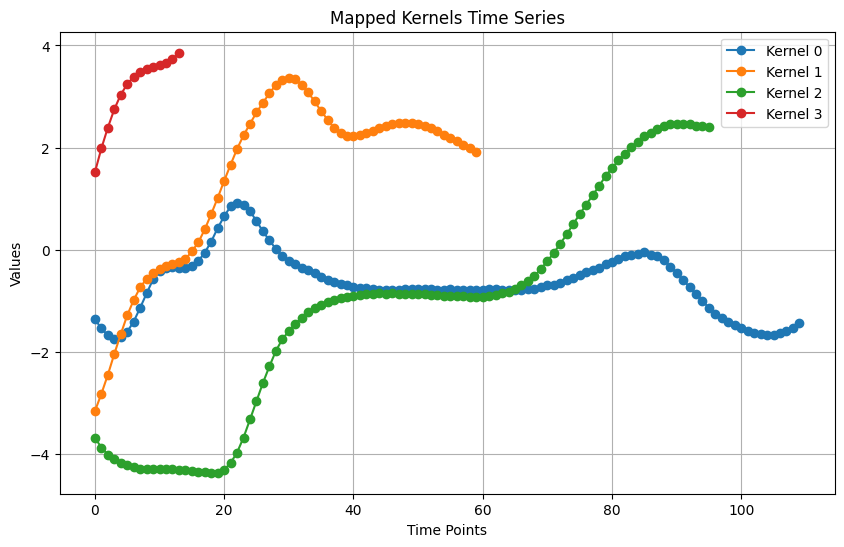

In [27]:
def plot_mapped_kernels(mapped_kernels):
    plt.figure(figsize=(10, 6))
    
    for kernel in mapped_kernels:
        time_points = [t for t, _ in kernel]
        values = [v for _, v in kernel]
        plt.plot(time_points, values, marker='o', label=f'Kernel {mapped_kernels.index(kernel)}')
    
    plt.xlabel('Time Points')
    plt.ylabel('Values')
    plt.title('Mapped Kernels Time Series')
    plt.legend()
    plt.grid(True)
    plt.show()

# Call the function to plot
plot_mapped_kernels(mapped_kernels_ppv)